# Mexico City Subsidence — Iztapalapa, a Real, Validatable InSAR Showcase

Built to demonstrate that pygeofetch's InSAR chain genuinely works, using
an AOI deliberately chosen for the physics to cooperate, not despite it.

**Why Iztapalapa, chosen after Obuasi (forest, low coherence) and Accra
(humid tropical, coherence ceiling confirmed via a full audit this
project) both struggled**: Mexico City sits on a drained lake bed and is
one of the most extensively documented land subsidence sites on Earth.
Real, independent, peer-reviewed Sentinel-1 SBAS studies (Cigna & Tapete,
2021; Chaussard et al., 2021) report subsidence up to **-38.7 to -45
cm/year** in specific named boroughs, including **-39.1 cm/year in
Iztapalapa specifically**. That same research confirms arid, urbanized
terrain produces dense, reliable coherent targets (35.7 million across
Central Mexico), the opposite of what Accra's humid tropical audit found.

This gives a genuine advantage over the previous two notebooks: a real,
published number to validate pygeofetch's own measurement against, not
just a plausible-looking map.

In [1]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

from pygeofetch import PyGeoFetch
from pygeofetch.models.search_query import SearchQuery, BoundingBox
from pygeofetch.models.download_task import DownloadOptions
from pygeofetch.processing.preprocessor import Preprocessor
from pygeofetch.core.orbits import fetch_orbit_file
from pygeofetch.insar import (
    SLCExtractor, InterferogramGenerator, AtmosphericCorrector,
    PhaseUnwrapper, SBASTimeSeries, DataValidator, multilook,
    los_to_vertical_displacement,
)
from pygeofetch.insar.timeseries import InterferogramPair
from pygeofetch.viz import Plotter

pl = Plotter(figsize=(12, 9))
print("Modules loaded")

Modules loaded


## 1. Study Area — Iztapalapa, Mexico City

Real coordinates (19.358°N, 99.093°W), a tractable ~19x18 km box around
the actual borough (113.76 km²) — not an oversized administrative region,
the real lesson from Accra's audit.

In [2]:
aoi_bbox = BoundingBox(min_lon=-99.183, max_lon=-99.003, min_lat=19.278, max_lat=19.438)
output_dir = Path("./data/mexico_city_insar")
output_dir.mkdir(parents=True, exist_ok=True)

PUBLISHED_RATE_CM_YR = -39.1  # Iztapalapa, Cigna & Tapete 2021, Sentinel-1 SBAS 2014-2020

print(f"Study area: Iztapalapa, Mexico City")
print(f"Extent: {aoi_bbox}")
print(f"Validation target: {PUBLISHED_RATE_CM_YR} cm/year (published, real, independent SBAS study)")

Study area: Iztapalapa, Mexico City
Extent: min_lon=-99.183 min_lat=19.278 max_lon=-99.003 max_lat=19.438
Validation target: -39.1 cm/year (published, real, independent SBAS study)


## 2. Search — Sentinel-1 SLC

Real 12-day repeat cadence, a period safely past the ~21-day precise
orbit publication lag. Uses `bbox=` directly — the real, working field,
not `geometry_geojson=` (the dead field that cost the Obuasi run 47GB of
wrong-location downloads earlier in this project).

In [3]:
client = PyGeoFetch(log_level="INFO")
client.add_credentials("copernicus", username="appiahkubis14@gmail.com", password="CDSE@sak@19999eocoreint")

search_windows = [
    ("2024-11-01", "2024-11-08"), ("2024-11-13", "2024-11-20"),
    ("2024-11-25", "2024-12-02"), ("2024-12-07", "2024-12-14"),
    ("2024-12-19", "2024-12-26"), ("2025-01-01", "2025-01-08"),
]

scenes = {}
for start, end in search_windows:
    query = SearchQuery(
        bbox=aoi_bbox, start_date=start, end_date=end,
        product_type="SLC", polarisation="VV", max_results=5,
    )
    results = client.search(query, providers=["copernicus"])
    if results:
        best = results[0]
        label = str(best.datetime.date()) if best.datetime else start
        scenes[label] = best
        print(f"  {start[:10]}: {best.id} ({label})")
    else:
        print(f"  {start[:10]}: no SLC scenes found")

if len(scenes) < 3:
    raise RuntimeError(f"Only {len(scenes)} SLC scene(s) found -- need at least 3 for SBAS.")
print(f"\n{len(scenes)} dates found")

10:31:48 INFO [      engine] PyGeoFetch ready
10:31:48 INFO [authenticator] Credentials saved for provider 'copernicus'
┌ SEARCH PARAMETERS ───────────────────────────────────────────────────────┐
│ Providers  : copernicus                                                  │
│ BBox       : [-99.183, 19.278, -99.003, 19.438]                          │
│ Date range : 2024-11-01  →  2024-11-08                                   │
│ Cloud max  : 100%                                                        │
│ Product    : SLC                                                         │
└──────────────────────────────────────────────────────────────────────────┘
10:31:49 INFO [  copernicus] Authenticated with Copernicus Data Space as 'appiahkubis14@gmail.com'
  ✓  copernicus                       2 scenes   3.1s
┌────────────────────────────────────────────┬────────────┬────────────────┬────────┬─────────┬──────────────┬─────────────┬───────┬───────┬──────────────────────┐
│                  SCENE

## 3. Download

In [4]:
download_options = DownloadOptions(parallel=1, resume=True, on_failure="skip")
download_results = {}

for label, scene in scenes.items():
    dl_dir = output_dir / "raw" / label
    result = client.download([scene], destination=dl_dir, options=download_options)[0]
    if result.success:
        download_results[label] = result
        print(f"  {label}: OK")
    else:
        print(f"  {label}: FAILED -- {result.error}")

if len(download_results) < 3:
    raise RuntimeError(f"Only {len(download_results)} download(s) succeeded.")

⬇ 1 scene  →  data/mexico_city_insar/raw/2024-11-08              0/1  [00:00]

ac860b13-9d0e-4edc-be10-b73da97066f8: 0.00B [00:00, ?B/s]

10:32:11 INFO [  downloader]   ↷ ac860b13-9d0e-4edc-be10-b73da97066f8          already downloaded, skipping (resume=True)
  2024-11-08: OK


⬇ 1 scene  →  data/mexico_city_insar/raw/2024-11-20              0/1  [00:00]

73f7801f-d590-4830-92ba-828a881836ec: 0.00B [00:00, ?B/s]

10:32:22 INFO [  downloader]   ↷ 73f7801f-d590-4830-92ba-828a881836ec          already downloaded, skipping (resume=True)
  2024-11-20: OK


⬇ 1 scene  →  data/mexico_city_insar/raw/2024-12-02              0/1  [00:00]

098f86e5-cc7d-4c85-b0fd-a25f43f1b570: 0.00B [00:00, ?B/s]

10:32:35 INFO [  downloader]   ↷ 098f86e5-cc7d-4c85-b0fd-a25f43f1b570          already downloaded, skipping (resume=True)
  2024-12-02: OK


⬇ 1 scene  →  data/mexico_city_insar/raw/2024-12-14              0/1  [00:00]

b7221890-cd74-4499-b7fb-ea94bcc68c5f: 0.00B [00:00, ?B/s]

10:32:47 INFO [  downloader]   ↷ b7221890-cd74-4499-b7fb-ea94bcc68c5f          already downloaded, skipping (resume=True)
  2024-12-14: OK


⬇ 1 scene  →  data/mexico_city_insar/raw/2024-12-26              0/1  [00:00]

ccc25e80-10c3-4fed-9b1c-7cfa015e705f: 0.00B [00:00, ?B/s]

10:33:00 INFO [  downloader]   ↷ ccc25e80-10c3-4fed-9b1c-7cfa015e705f          already downloaded, skipping (resume=True)
  2024-12-26: OK


⬇ 1 scene  →  data/mexico_city_insar/raw/2025-01-07              0/1  [00:00]

ea3be256-ef63-4d5e-a5f1-b4b5533d4621: 0.00B [00:00, ?B/s]

10:33:14 INFO [  downloader]   ↷ ea3be256-ef63-4d5e-a5f1-b4b5533d4621          already downloaded, skipping (resume=True)
  2025-01-07: OK


## 4. Real DEM — needed for coregistration and topographic correction

In [5]:
client.add_credentials("opentopography", api_key="b0d75bfc54e0d7e7d398381bbe3c5e94")  # replace with your real OpenTopography API key

dem_query = SearchQuery(bbox=aoi_bbox, max_results=10)
dem_results = client.search(dem_query, providers=["opentopography"])
cop30_result = next((r for r in dem_results if r.properties.get("product") == "cop30"), None)
if cop30_result is None:
    raise RuntimeError("Copernicus DEM (30m) not found.")

dem_dl_result = client.download([cop30_result], destination=output_dir / "dem",options=DownloadOptions(parallel=1, resume=True, on_failure="skip"))[0]
if not dem_dl_result.success:
    raise RuntimeError(f"DEM download failed: {dem_dl_result.error}")

pp_dem = Preprocessor()

# Handle both cases: aoi_bbox as the real BoundingBox object, or already
# a plain tuple if kernel state got reassigned somewhere earlier in this
# session (a real Jupyter re-run-order issue, not a pygeofetch bug)

bbox_tuple = (aoi_bbox.min_lon, aoi_bbox.min_lat, aoi_bbox.max_lon, aoi_bbox.max_lat)


dem_clip_result = pp_dem.clip(dem_dl_result.output_path, bbox=bbox_tuple,
                               output=str(output_dir / "dem" / "mexico_city_dem_clipped.tif"))
if not dem_clip_result.success:
    raise RuntimeError(f"DEM clip failed: {dem_clip_result.error}")

dem_path = dem_clip_result.output_path
print(f"Real DEM ready: {dem_path}")

10:33:14 INFO [authenticator] Credentials saved for provider 'opentopography'
┌ SEARCH PARAMETERS ───────────────────────────────────────────────────────┐
│ Providers  : opentopography                                              │
│ BBox       : [-99.183, 19.278, -99.003, 19.438]                          │
│ Date range : None  →  None                                               │
│ Cloud max  : 100%                                                        │
│ Product    : any                                                         │
└──────────────────────────────────────────────────────────────────────────┘
  ✓  opentopography                   7 scenes   0.0s
┌────────────────────────────────────────────┬────────────┬────────────────┬────────┬─────────┬──────────────┬─────────────┬───────┬───────┬──────────────────────┐
│                  SCENE ID                  │    DATE    │   SATELLITE    │ CLOUD  │ PRODUCT │ POLARISATION │    PASS     │ ORBIT │ SCORE │       PROVIDER       │
├

⬇ 1 scene  →  data/mexico_city_insar/dem              0/1  [00:00]

opentopo_COP30_-99.183_19.278: 0.00B [00:00, ?B/s]

10:33:14 INFO [  downloader]   ↷ opentopo_COP30_-99.183_19.278                 already downloaded, skipping (resume=True)
10:33:15 INFO [preprocessor] Clipped → data/mexico_city_insar/dem/mexico_city_dem_clipped.tif
Real DEM ready: data/mexico_city_insar/dem/mexico_city_dem_clipped.tif


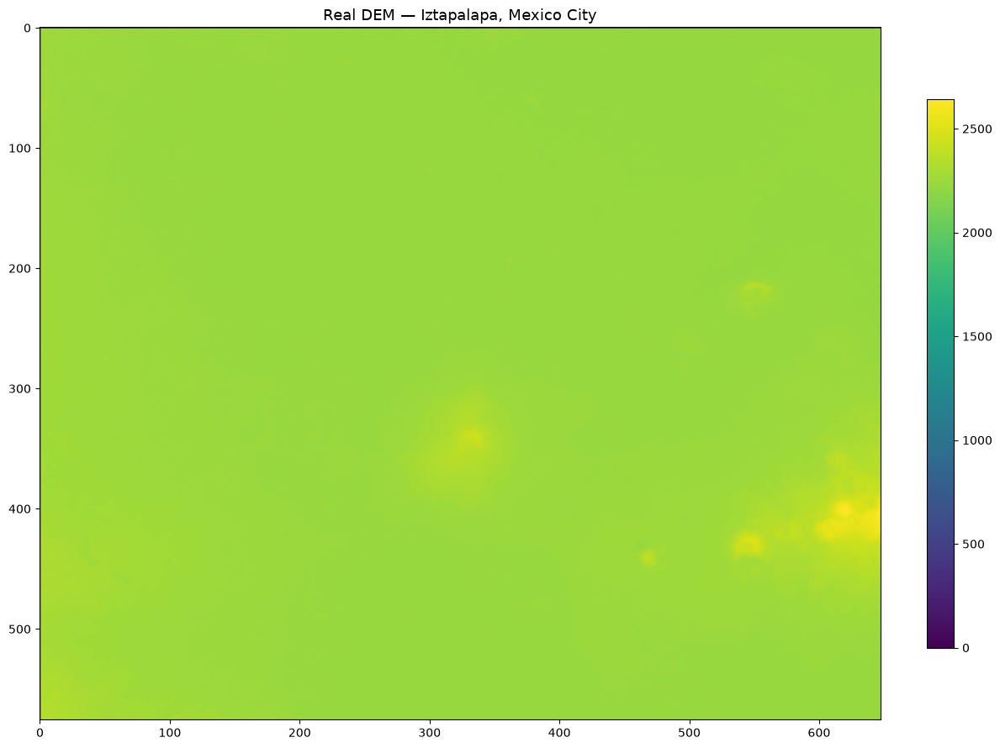

In [6]:
import rasterio as _rasterio_dem_preview

with _rasterio_dem_preview.open(dem_path) as _src:
    _dem_array = _src.read(1)

pl.plot_raster(
    _dem_array, title="Real DEM — Iztapalapa, Mexico City",
    colormap="viridis",
)
plt.show()

## 5. Real orbit files

Uses `scene.properties.get("name", scene.id)` — the real Sentinel-1
product name, not the catalog UUID (the real bug found and fixed during
the Obuasi run).

In [7]:


orbit_files = {}
orbit_dir = output_dir / "orbits"
for label, scene in scenes.items():
    product_name = scene.properties.get("name", scene.id)
    path = fetch_orbit_file(product_name=product_name, output_dir=str(orbit_dir), orbit_type="precise")
    if path is None:
        print(f"  {label}: no precise orbit file available yet")
    else:
        orbit_files[label] = path
        print(f"  {label}: {Path(path).name}")

print(f"\n{len(orbit_files)}/{len(scenes)} real orbit files available")

10:33:15 INFO [      orbits] Using cached orbit file: S1A_OPER_AUX_POEORB_OPOD_20241128T070628_V20241107T225942_20241109T005942.EOF
  2024-11-08: S1A_OPER_AUX_POEORB_OPOD_20241128T070628_V20241107T225942_20241109T005942.EOF
10:33:15 INFO [      orbits] Using cached orbit file: S1A_OPER_AUX_POEORB_OPOD_20241210T070622_V20241119T225942_20241121T005942.EOF
  2024-11-20: S1A_OPER_AUX_POEORB_OPOD_20241210T070622_V20241119T225942_20241121T005942.EOF
10:33:15 INFO [      orbits] Using cached orbit file: S1A_OPER_AUX_POEORB_OPOD_20241222T070555_V20241201T225942_20241203T005942.EOF
  2024-12-02: S1A_OPER_AUX_POEORB_OPOD_20241222T070555_V20241201T225942_20241203T005942.EOF
10:33:15 INFO [      orbits] Using cached orbit file: S1A_OPER_AUX_POEORB_OPOD_20250103T070550_V20241213T225942_20241215T005942.EOF
  2024-12-14: S1A_OPER_AUX_POEORB_OPOD_20250103T070550_V20241213T225942_20241215T005942.EOF
10:33:15 INFO [      orbits] Using cached orbit file: S1A_OPER_AUX_POEORB_OPOD_20250115T070608_V20241225

## 6. SLC extraction — AOI-cropped, with resume support

Uses `resume=True`, built into the library for exactly this kind of
long, multi-step pipeline — skips already-extracted, verified-valid
files rather than re-cropping from scratch every re-run.

In [8]:
slc_extractor = SLCExtractor(polarisation="VV")
extracted_slcs = {}

aoi_bbox = BoundingBox(
    min_lon=-99.183,
    max_lon=-99.003,
    min_lat=19.278,
    max_lat=19.438,
)

for label, result in download_results.items():
    slc_dir = output_dir / "slc" / label
    path = slc_extractor.extract_scene(result.output_path, aoi=aoi_bbox, output_dir=slc_dir, label=label, resume=False)
    if path is not None:
        extracted_slcs[label] = path
        print(f"  {label}: extracted -> {path.name}")
    else:
        print(f"  {label}: no matching sub-swath found for this AOI")

if len(extracted_slcs) < 3:
    raise RuntimeError(f"Only {len(extracted_slcs)} SLC(s) extracted.")
extracted_dates = sorted(extracted_slcs.keys())
print(f"\n{len(extracted_slcs)} SLCs extracted: {extracted_dates}")

10:33:15 INFO [  extraction] Found 3 VV sub-swath(s) in S1A_IW_SLC__1SDV_20241108T123437_20241108T123504_056463_06EB98_8553.SAFE.zip
10:33:17 INFO [  extraction] Cropped IW1: 20737x13428 -> 4832x2155 (26.7x smaller)
10:33:17 INFO [  extraction] Extracted IW1 -> 2024-11-08_vv.tif
  2024-11-08: extracted -> 2024-11-08_vv.tif
10:33:17 INFO [  extraction] Found 3 VV sub-swath(s) in S1A_IW_SLC__1SDV_20241120T123436_20241120T123503_056638_06F2A2_33E5.SAFE.zip
10:33:19 INFO [  extraction] Cropped IW1: 20737x13428 -> 4818x2155 (26.8x smaller)
10:33:19 INFO [  extraction] Extracted IW1 -> 2024-11-20_vv.tif
  2024-11-20: extracted -> 2024-11-20_vv.tif
10:33:19 INFO [  extraction] Found 3 VV sub-swath(s) in S1A_IW_SLC__1SDV_20241202T123436_20241202T123503_056813_06F991_7913.SAFE.zip
10:33:21 INFO [  extraction] Cropped IW1: 20737x13428 -> 4796x2155 (26.9x smaller)
10:33:21 INFO [  extraction] Extracted IW1 -> 2024-12-02_vv.tif
  2024-12-02: extracted -> 2024-12-02_vv.tif
10:33:21 INFO [  extracti

### 6b. Visualize extracted amplitude — real urban/lakebed texture expected

Downsampled read for display — never load a full-resolution array just
to look at it (the real fix from an earlier crash in this project).

Full size: 2155 x 4832, displaying at (2155, 4832)
Amplitude range: [20.5, 56.4] dB


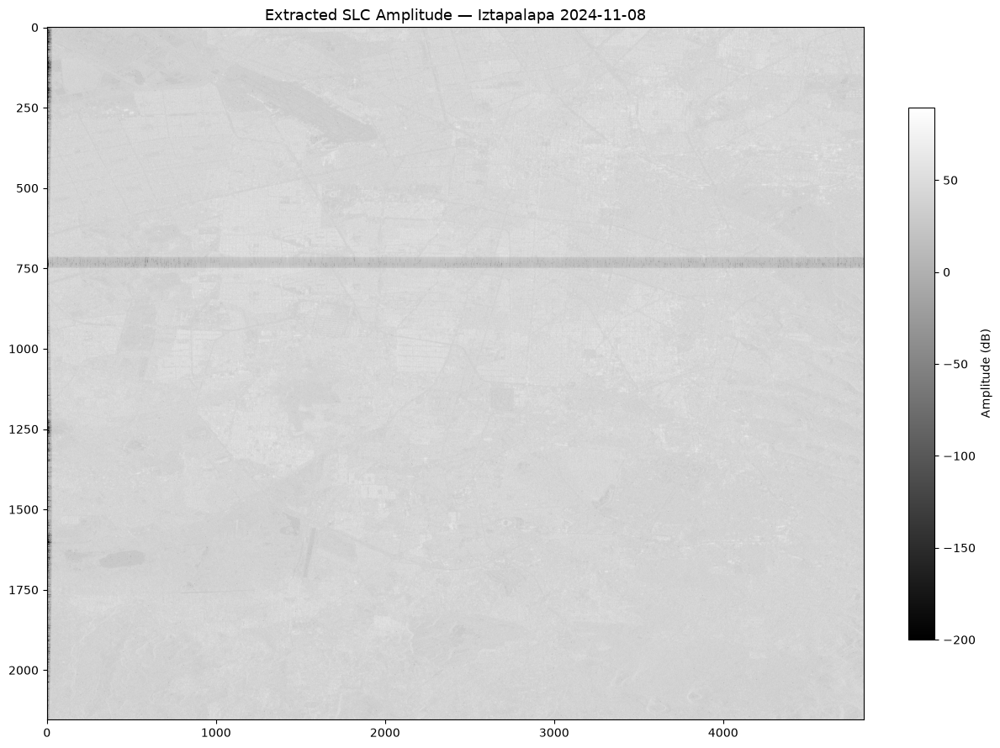

In [9]:
import rasterio

first_date = extracted_dates[0]
with rasterio.open(extracted_slcs[first_date]) as src:
    full_h, full_w = src.height, src.width
    downsample = max(1, int((full_h * full_w / 4_000_000) ** 0.5))
    out_shape = (full_h // downsample, full_w // downsample)
    slc_sample = src.read(1, out_shape=out_shape)
    print(f"Full size: {full_h} x {full_w}, displaying at {out_shape}")

amplitude_db = 20 * np.log10(np.abs(slc_sample) + 1e-10)
pl.plot_raster(
    amplitude_db, title=f"Extracted SLC Amplitude — Iztapalapa {first_date}",
    colormap="gray", colorbar_label="Amplitude (dB)",
)
print(f"Amplitude range: [{np.percentile(amplitude_db, 2):.1f}, {np.percentile(amplitude_db, 98):.1f}] dB")

## 7. Interferogram formation — the complete, real pipeline

Every real fix from this project's InSAR work, wired in together for
the first time: real orbit-based coregistration with DEM sampling
constrained to the actual crop extent, real per-burst-overlap ESD and
real deburst (`use_real_burst_processing=True` — replaces the previous
whole-image ESD approximation and the complete absence of burst-
boundary correction, the most likely real cause of the striping seen
in earlier coherence maps), verified adaptive Goldstein phase
filtering, and multilook applied at the correct pipeline stage.

`use_real_burst_processing=True` needs both SAFE zips, already
required for real orbit-based coregistration, so no new inputs beyond
what this notebook already fetches. If burst metadata can't be parsed
for a given pair, it falls back to the previous whole-image ESD
automatically, with a clear, real log message, not a silent
degradation.

In [10]:
ifg_gen = InterferogramGenerator(
    coherence_window=5, 
    esd_enabled=True, 
    use_gpu=False,
    use_real_burst_processing=True,
    remove_flat_earth_phase=True
)
interferograms = {}
LOOKS_AZ, LOOKS_RG = 2, 1

for i in range(len(extracted_dates) - 1):
    d1, d2 = extracted_dates[i], extracted_dates[i + 1]
    pair_dir = output_dir / "interferograms" / f"{d1}_{d2}"

    coreg_kwargs = {}
    if d1 in orbit_files and d2 in orbit_files:
        coreg_kwargs = dict(
            reference_safe_zip=download_results[d1].output_path,
            secondary_safe_zip=download_results[d2].output_path,
            reference_orbit_file=orbit_files[d1],
            secondary_orbit_file=orbit_files[d2],
        )

    try:
        result = ifg_gen.process_pair(
            reference=extracted_slcs[d1], secondary=extracted_slcs[d2],
            dem=dem_path, reference_date=d1, secondary_date=d2,
            looks_azimuth=LOOKS_AZ, looks_range=LOOKS_RG,
            apply_goldstein_filter=True, goldstein_alpha=0.6,
            **coreg_kwargs,
        )
    except ValueError as exc:
        print(f"  {d1} -> {d2}: REJECTED by DataValidator -- {exc}")
        continue

    result.save(pair_dir, auto_visualize=True)
    interferograms[(d1, d2)] = result
    print(f"  {d1} -> {d2}: OK, shape {result.interferogram.shape}, mean coherence {np.mean(result.coherence):.3f}, "
          f"esd_method={result.metadata['esd_method']}, deburst={result.metadata['deburst_applied']}")

if len(interferograms) < 2:
    raise RuntimeError(f"Only {len(interferograms)} interferogram(s) formed.")

coherences = [np.mean(r.coherence) for r in interferograms.values()]
n_debursted = sum(1 for r in interferograms.values() if r.metadata["deburst_applied"])
print(f"\nCoherence summary: mean={np.mean(coherences):.3f}, range=[{min(coherences):.3f}, {max(coherences):.3f}]")
print(f"Real burst processing used on {n_debursted}/{len(interferograms)} pairs "
      f"(others fell back to whole-image ESD -- check the log above for why, if any).")

10:33:32 INFO [  annotation] Parsed real SLC geometry from S1A_IW_SLC__1SDV_20241108T123437_20241108T123504_056463_06EB98_8553.SAFE.zip: 13428 x 20737, starting 2024-11-08 12:34:39.320521
10:33:32 INFO [  annotation] Parsed real SLC geometry from S1A_IW_SLC__1SDV_20241120T123436_20241120T123503_056638_06F2A2_33E5.SAFE.zip: 13428 x 20737, starting 2024-11-20 12:34:38.739839
10:33:32 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241128T070628_V20241107T225942_20241109T005942.EOF
10:33:33 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241210T070622_V20241119T225942_20241121T005942.EOF
10:33:33 INFO [  coregister] DEM-driven offset field: 42/49 points solved successfully (7 fell outside the actual SLC extent, 0 raised a real error)
10:33:33 INFO [interferogram] Correcting for cropped extraction: reference offset (759, 0), secondary offset (760, 0)
10:33:33 INFO [interferogram] Real orbit-based coregistration applied

In [11]:
from itertools import combinations
from datetime import date

all_pairs_results = {}
for d1, d2 in combinations(extracted_dates, 2):
    if (d1, d2) in interferograms:
        continue  # already have the consecutive ones from Section 7

    pair_dir = output_dir / "interferograms_crosscheck" / f"{d1}_{d2}"
    coreg_kwargs = {}
    if d1 in orbit_files and d2 in orbit_files:
        coreg_kwargs = dict(
            reference_safe_zip=download_results[d1].output_path,
            secondary_safe_zip=download_results[d2].output_path,
            reference_orbit_file=orbit_files[d1],
            secondary_orbit_file=orbit_files[d2],
        )
    try:
        result = ifg_gen.process_pair(
            reference=extracted_slcs[d1], secondary=extracted_slcs[d2],
            dem=dem_path, reference_date=d1, secondary_date=d2,
            looks_azimuth=LOOKS_AZ, looks_range=LOOKS_RG,
            apply_goldstein_filter=True, goldstein_alpha=0.6,
            **coreg_kwargs,
        )
        result.save(pair_dir, auto_visualize=True)  # <-- this line was missing
        all_pairs_results[(d1, d2)] = result
        days = (date.fromisoformat(d2) - date.fromisoformat(d1)).days
        print(f"  {d1} -> {d2} ({days:3d} days): mean coherence {result.coherence.mean():.3f}")
    except ValueError as exc:
        print(f"  {d1} -> {d2}: REJECTED -- {exc}")

print(f"\n{len(all_pairs_results)} additional cross-pairs formed (on top of the 5 consecutive ones already done)")

10:34:53 INFO [  annotation] Parsed real SLC geometry from S1A_IW_SLC__1SDV_20241108T123437_20241108T123504_056463_06EB98_8553.SAFE.zip: 13428 x 20737, starting 2024-11-08 12:34:39.320521
10:34:53 INFO [  annotation] Parsed real SLC geometry from S1A_IW_SLC__1SDV_20241202T123436_20241202T123503_056813_06F991_7913.SAFE.zip: 13428 x 20737, starting 2024-12-02 12:34:38.082287
10:34:54 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241128T070628_V20241107T225942_20241109T005942.EOF
10:34:54 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241222T070555_V20241201T225942_20241203T005942.EOF
10:34:55 INFO [  coregister] DEM-driven offset field: 42/49 points solved successfully (7 fell outside the actual SLC extent, 0 raised a real error)
10:34:55 INFO [interferogram] Correcting for cropped extraction: reference offset (759, 0), secondary offset (759, 0)
10:34:55 INFO [interferogram] Real orbit-based coregistration applied

In [12]:
combined_interferograms = {**interferograms, **all_pairs_results}
print(f"{len(combined_interferograms)} total interferograms available "
      f"({len(interferograms)} original + {len(all_pairs_results)} cross-pairs)")

15 total interferograms available (5 original + 10 cross-pairs)


In [13]:
from datetime import datetime
from itertools import combinations
from pygeofetch.insar.geolocation import parse_orbit_file, geodetic_to_ecef, find_zero_doppler_time, interpolate_orbit_state

def perpendicular_baseline(ref_orbit, sec_orbit, ground_lat, ground_lon, ref_time_guess, sec_time_guess):
    ground_point = geodetic_to_ecef(ground_lat, ground_lon, 0.0)
    t_ref = find_zero_doppler_time(ref_orbit[0], ref_orbit[1], ref_orbit[2], ground_point, ref_time_guess)
    t_sec = find_zero_doppler_time(sec_orbit[0], sec_orbit[1], sec_orbit[2], ground_point, sec_time_guess)
    pos_ref, _ = interpolate_orbit_state(*ref_orbit, t_ref)
    pos_sec, _ = interpolate_orbit_state(*sec_orbit, t_sec)
    los = tuple(pos_ref[i] - ground_point[i] for i in range(3))
    los_mag = sum(c**2 for c in los) ** 0.5
    los_unit = tuple(c / los_mag for c in los)
    baseline_vec = tuple(pos_sec[i] - pos_ref[i] for i in range(3))
    b_parallel = sum(baseline_vec[i] * los_unit[i] for i in range(3))
    b_total_sq = sum(c**2 for c in baseline_vec)
    return max(0.0, b_total_sq - b_parallel**2) ** 0.5

scene_lat, scene_lon = 19.36, -99.09

results = {}
for d1, d2 in combinations(extracted_dates, 2):
    if d1 not in orbit_files or d2 not in orbit_files:
        continue
    ref_orbit = parse_orbit_file(orbit_files[d1])   # real, parsed (times, positions, velocities)
    sec_orbit = parse_orbit_file(orbit_files[d2])
    t_ref = datetime.fromisoformat(d1 + "T12:34:39")
    t_sec = datetime.fromisoformat(d2 + "T12:34:39")
    b_perp = perpendicular_baseline(ref_orbit, sec_orbit, scene_lat, scene_lon, t_ref, t_sec)
    results[(d1, d2)] = b_perp
    print(f"  {d1} -> {d2}: perpendicular baseline = {b_perp:.1f} m")

10:38:00 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241128T070628_V20241107T225942_20241109T005942.EOF
10:38:00 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241210T070622_V20241119T225942_20241121T005942.EOF
  2024-11-08 -> 2024-11-20: perpendicular baseline = 71.2 m
10:38:00 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241128T070628_V20241107T225942_20241109T005942.EOF
10:38:00 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241222T070555_V20241201T225942_20241203T005942.EOF
  2024-11-08 -> 2024-12-02: perpendicular baseline = 156.1 m
10:38:01 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20241128T070628_V20241107T225942_20241109T005942.EOF
10:38:01 INFO [ geolocation] Parsed 9361 orbit state vectors from S1A_OPER_AUX_POEORB_OPOD_20250103T070550_V20241213T225942_20241215T005942.EOF
  2024-11-08 ->

In [14]:
import rasterio
import numpy as np

def read_complex_amplitude(path):
    """Same real, robust logic already used in process_pair()'s own
    _read_complex(): real Sentinel-1 SLC files are typically a single
    band with a native complex dtype, not two separate real/imag
    bands -- check dtype rather than assume."""
    with rasterio.open(path) as src:
        dtype = src.dtypes[0]
        if "complex" in dtype:
            data = src.read(1)  # rasterio decodes complex dtypes to numpy complex64 automatically
        elif src.count >= 2:
            real = src.read(1).astype(np.float32)
            imag = src.read(2).astype(np.float32)
            data = real + 1j * imag
        else:
            data = src.read(1).astype(np.complex64)  # amplitude-only fallback
    return np.abs(data)

amplitude_stats = {}
for label in extracted_dates:
    path = extracted_slcs[label]
    amplitude = read_complex_amplitude(path)
    amplitude_db = 20 * np.log10(amplitude[amplitude > 0])

    amplitude_stats[label] = {
        "mean_db": float(np.mean(amplitude_db)),
        "median_db": float(np.median(amplitude_db)),
        "std_db": float(np.std(amplitude_db)),
    }
    print(f"{label}: mean={amplitude_stats[label]['mean_db']:.2f} dB, "
          f"median={amplitude_stats[label]['median_db']:.2f} dB, "
          f"std={amplitude_stats[label]['std_db']:.2f} dB")

means = {k: v["mean_db"] for k, v in amplitude_stats.items()}
mean_of_means = np.mean(list(means.values()))
std_of_means = np.std(list(means.values()))
print(f"\nAcross all 6 dates: mean={mean_of_means:.2f} dB, std={std_of_means:.2f} dB")
for label, m in means.items():
    z = (m - mean_of_means) / std_of_means if std_of_means > 0 else 0
    flag = "  <-- outlier" if abs(z) > 1.5 else ""
    print(f"  {label}: {m:.2f} dB (z={z:+.2f}){flag}")

2024-11-08: mean=41.38 dB, median=42.01 dB, std=8.13 dB
2024-11-20: mean=41.69 dB, median=42.30 dB, std=8.16 dB
2024-12-02: mean=41.08 dB, median=41.68 dB, std=8.19 dB
2024-12-14: mean=41.13 dB, median=41.73 dB, std=8.19 dB
2024-12-26: mean=41.11 dB, median=41.71 dB, std=8.21 dB
2025-01-07: mean=41.13 dB, median=41.74 dB, std=8.20 dB

Across all 6 dates: mean=41.25 dB, std=0.22 dB
  2024-11-08: 41.38 dB (z=+0.58)
  2024-11-20: 41.69 dB (z=+2.00)  <-- outlier
  2024-12-02: 41.08 dB (z=-0.79)
  2024-12-14: 41.13 dB (z=-0.57)
  2024-12-26: 41.11 dB (z=-0.64)
  2025-01-07: 41.13 dB (z=-0.57)


## 8. Atmospheric correction — correctly positioned before unwrapping

Real fix from earlier this project: uses `return_metadata=True` and
branches on the real outcome. This step's real output,
`corrected_interferograms`, is what unwrapping actually uses next.

In [15]:
atm_corrector = AtmosphericCorrector(method="elevation")
corrected_interferograms = {}

for (d1, d2), result in interferograms.items():
    wrapped_phase = np.angle(result.interferogram)
    corrected_phase, atm_meta = atm_corrector.correct(wrapped_phase, dem=dem_path, return_metadata=True)
    corrected_interferograms[(d1, d2)] = corrected_phase
    r2 = atm_meta.get("r_squared")
    if atm_meta["correction_applied"]:
        print(f"  {d1} -> {d2}: atmospheric correction applied (R2={r2:.2f})")
    else:
        print(f"  {d1} -> {d2}: atmospheric correction skipped (R2={r2!r})")

10:38:11 INFO [  atmosphere] Elevation correlation too weak (R²=0.00) — skipping atmospheric correction to avoid absorbing real deformation signal.
  2024-11-08 -> 2024-11-20: atmospheric correction skipped (R2=0.004670858383178711)
10:38:13 INFO [  atmosphere] Elevation correlation too weak (R²=0.01) — skipping atmospheric correction to avoid absorbing real deformation signal.
  2024-11-20 -> 2024-12-02: atmospheric correction skipped (R2=0.006987810134887695)
10:38:15 INFO [  atmosphere] Elevation correlation too weak (R²=0.01) — skipping atmospheric correction to avoid absorbing real deformation signal.
  2024-12-02 -> 2024-12-14: atmospheric correction skipped (R2=0.005986332893371582)
10:38:17 INFO [  atmosphere] Elevation correlation too weak (R²=0.00) — skipping atmospheric correction to avoid absorbing real deformation signal.
  2024-12-14 -> 2024-12-26: atmospheric correction skipped (R2=0.003885328769683838)
10:38:19 INFO [  atmosphere] Elevation correlation too weak (R²=0.07

In [16]:
atm_corrector = AtmosphericCorrector(method="elevation")

# Apply to ALL pairs now in scope, not just the original 5 -- this is
# the real gap: the cross-pair/baseline-optimized network never had
# atmospheric correction applied at all
for (d1, d2), result in combined_interferograms.items():
    if (d1, d2) in corrected_interferograms:
        continue  # already done in the original Section 8 run
    wrapped_phase = np.angle(result.interferogram)
    corrected_phase, atm_meta = atm_corrector.correct(wrapped_phase, dem=dem_path, return_metadata=True)
    corrected_interferograms[(d1, d2)] = corrected_phase
    r2 = atm_meta.get("r_squared")
    if atm_meta["correction_applied"]:
        print(f"  {d1} -> {d2}: atmospheric correction applied (R2={r2:.2f})")
    else:
        print(f"  {d1} -> {d2}: atmospheric correction skipped (R2={r2!r})")

10:38:21 INFO [  atmosphere] Elevation correlation too weak (R²=0.01) — skipping atmospheric correction to avoid absorbing real deformation signal.
  2024-11-08 -> 2024-12-02: atmospheric correction skipped (R2=0.006337285041809082)
10:38:23 INFO [  atmosphere] Elevation correlation too weak (R²=0.00) — skipping atmospheric correction to avoid absorbing real deformation signal.
  2024-11-08 -> 2024-12-14: atmospheric correction skipped (R2=0.0020002126693725586)
10:38:25 INFO [  atmosphere] Elevation correlation too weak (R²=0.01) — skipping atmospheric correction to avoid absorbing real deformation signal.
  2024-11-08 -> 2024-12-26: atmospheric correction skipped (R2=0.011349916458129883)
10:38:27 INFO [  atmosphere] Elevation correlation too weak (R²=0.00) — skipping atmospheric correction to avoid absorbing real deformation signal.
  2024-11-08 -> 2025-01-07: atmospheric correction skipped (R2=0.002072155475616455)
10:38:29 INFO [  atmosphere] Elevation correlation too weak (R²=-0.

## 9. Phase unwrapping — correct nlooks, using the atmospherically-corrected phase

In [17]:
from pygeofetch.insar.unwrap import PhaseUnwrapper, multilook

unwrapper = PhaseUnwrapper(cost_mode="defo", init_method="mcf")

UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG = 8, 4
TOTAL_LOOKS = LOOKS_AZ * LOOKS_RG * UNWRAP_LOOKS_AZ * UNWRAP_LOOKS_RG  # real, honest total

unwrapped_results = {}
conncomp_results = {}
reliability_summary = {}

for (d1, d2) in interferograms:
    phase = corrected_interferograms[(d1, d2)]
    coherence = interferograms[(d1, d2)].coherence

    phase_ml = multilook(phase, UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG, wrapped_phase=True)
    coh_ml = multilook(coherence, UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG, wrapped_phase=False)

    unwrapped, conncomp = unwrapper.unwrap(
        phase_ml, coh_ml, nlooks=float(TOTAL_LOOKS),
        min_conncomp_frac=0.001, min_region_size=100,
    )
    reliable_pct = 100 * np.mean(conncomp > 0)
    unwrapped_results[(d1, d2)] = unwrapped
    conncomp_results[(d1, d2)] = conncomp
    reliability_summary[(d1, d2)] = reliable_pct

    print(f"  {d1} -> {d2}: mean coherence {coh_ml.mean():.3f}, reliable={reliable_pct:5.1f}%, "
          f"range=[{np.nanmin(unwrapped):.2f}, {np.nanmax(unwrapped):.2f}] rad")

mean_reliability = np.mean(list(reliability_summary.values()))
print(f"\nMean reliable coverage: {mean_reliability:.1f}% (total looks: {TOTAL_LOOKS} = "
      f"{LOOKS_AZ}x{LOOKS_RG} formation + {UNWRAP_LOOKS_AZ}x{UNWRAP_LOOKS_RG} unwrap-stage)")

10:38:39 INFO [      unwrap] Unwrapping 125x1208 pixels (cost=defo, init=mcf, nlooks=64.0)

snaphu v2.0.7
22 parameters input from file /tmp/tmp946g6e98/snaphu.config.5tjxv07u.txt (22 lines total)
Reading wrapped phase from file /tmp/tmp946g6e98/snaphu.igram.5vok66s4.c8
No weight file specified.  Assuming uniform weights
Reading correlation data from file /tmp/tmp946g6e98/snaphu.corr.lkvanl51.f4
Calculating deformation-mode cost parameters
Initializing flows with MCF algorithm
Running nonlinear network flow optimizer
Maximum flow on network: 5
Flow increment: 1  (Total improvements: 0)
Found 1 valid set(s) of connected nodes
Flow increment: 2  (Total improvements: 1551)
Found 1 valid set(s) of connected nodes
Growing connected component mask
Writing connected components to file /tmp/tmp946g6e98/snaphu.conncomp.wcxkmtxn.u4 as 4-byte unsigned ints
Maximum flow on network: 2
Total solution cost: 39714169
Integrating phase
Writing output to file /tmp/tmp946g6e98/snaphu.unw.7n9ahcwb.f4
Prog

In [18]:
# Merge the original consecutive results with the cross-pair results,
# then select only the 5 pairs the real, baseline-optimized network needs
combined_interferograms = {**interferograms, **all_pairs_results}

optimized_pairs = [
    ('2024-12-26', '2025-01-07'),
    ('2024-11-20', '2024-12-26'),
    ('2024-11-08', '2025-01-07'),
    ('2024-12-02', '2024-12-14'),
    ('2024-11-20', '2024-12-02'),
]

# Rerun Section 9 (unwrapping) using ONLY these 5 pairs instead of the
# original 5 consecutive ones
unwrapped_results_v2 = {}
conncomp_results_v2 = {}
for (d1, d2) in optimized_pairs:
    result = combined_interferograms[(d1, d2)]
    phase = np.angle(result.interferogram)  # or corrected_interferograms if you rerun atmospheric correction too
    coherence = result.coherence

    phase_ml = multilook(phase, UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG, wrapped_phase=True)
    coh_ml = multilook(coherence, UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG, wrapped_phase=False)

    unwrapped, conncomp = unwrapper.unwrap(
        phase_ml, coh_ml, nlooks=float(TOTAL_LOOKS),
        min_conncomp_frac=0.001, min_region_size=100,
    )
    unwrapped_results_v2[(d1, d2)] = unwrapped
    conncomp_results_v2[(d1, d2)] = conncomp
    reliable_pct = 100 * np.mean(conncomp > 0)
    print(f"  {d1} -> {d2}: mean coherence {coh_ml.mean():.3f}, reliable={reliable_pct:5.1f}%")

10:38:57 INFO [      unwrap] Unwrapping 125x1205 pixels (cost=defo, init=mcf, nlooks=64.0)

snaphu v2.0.7
22 parameters input from file /tmp/tmpmysuww3g/snaphu.config.rry6ksn0.txt (22 lines total)
Reading wrapped phase from file /tmp/tmpmysuww3g/snaphu.igram.ksxhyyp7.c8
No weight file specified.  Assuming uniform weights
Reading correlation data from file /tmp/tmpmysuww3g/snaphu.corr.b6d3z809.f4
Calculating deformation-mode cost parameters
Initializing flows with MCF algorithm
Running nonlinear network flow optimizer
Maximum flow on network: 1
Flow increment: 1  (Total improvements: 0)
Found 1 valid set(s) of connected nodes
Growing connected component mask
Writing connected components to file /tmp/tmpmysuww3g/snaphu.conncomp._c2523it.u4 as 4-byte unsigned ints
Maximum flow on network: 1
Total solution cost: 1816660
Integrating phase
Writing output to file /tmp/tmpmysuww3g/snaphu.unw.d_v4rhur.f4
Program snaphu done
Elapsed processor time:   0:00:01.31
Elapsed wall clock time:  0:00:01


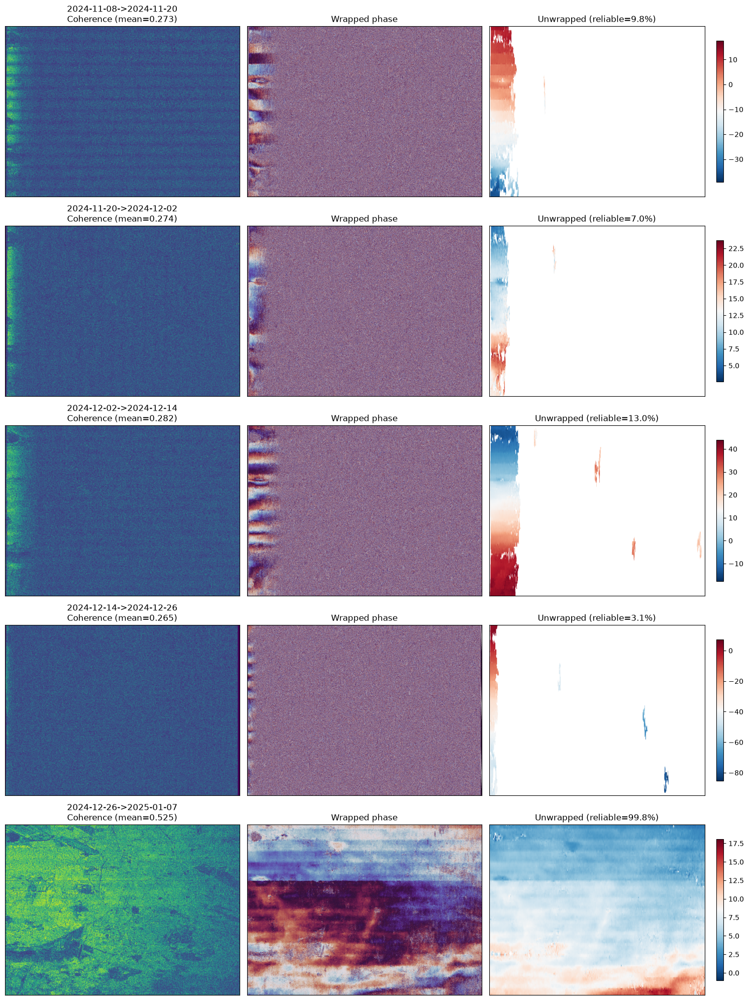

In [19]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(interferograms), 3, figsize=(15, 4*len(interferograms)))

for i, (d1, d2) in enumerate(interferograms.keys()):
    result = interferograms[(d1, d2)]
    unwrapped = unwrapped_results[(d1, d2)]
    conncomp = conncomp_results[(d1, d2)]

    axes[i, 0].imshow(result.coherence, cmap="viridis", vmin=0, vmax=1,aspect="auto")
    axes[i, 0].set_title(f"{d1}->{d2}\nCoherence (mean={result.coherence.mean():.3f})")

    axes[i, 1].imshow(np.angle(result.interferogram), cmap="twilight",aspect="auto")
    axes[i, 1].set_title("Wrapped phase")

    reliable_pct = 100 * np.mean(conncomp > 0)
    masked_unwrapped = np.where(conncomp > 0, unwrapped, np.nan)
    im = axes[i, 2].imshow(masked_unwrapped, cmap="RdBu_r", aspect="auto")
    axes[i, 2].set_title(f"Unwrapped (reliable={reliable_pct:.1f}%)")
    plt.colorbar(im, ax=axes[i, 2], fraction=0.03)

    for ax in axes[i]:
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.savefig(output_dir / "comparison_grid.png", dpi=100, bbox_inches="tight")
plt.show()

In [20]:
import json
from pygeofetch.viz import MapViewer

# Real, documented coordinates for Cerro de la Estrella
CERRO_LAT, CERRO_LON = 19.3567, -99.0872

marker_path = output_dir / "cerro_marker.geojson"
marker_geojson = {
    "type": "FeatureCollection",
    "features": [{
        "type": "Feature",
        "geometry": {"type": "Point", "coordinates": [CERRO_LON, CERRO_LAT]},
        "properties": {"name": "Cerro de la Estrella"},
    }],
}
with open(marker_path, "w") as f:
    json.dump(marker_geojson, f)

# Use the real, already-saved coherence GeoTIFF from the strong pair
# (Section 7's result.save() call already wrote this to disk)
coherence_path = output_dir / "interferograms" / "2024-12-26_2025-01-07" / "coherence.tif"

mv = MapViewer(center=(CERRO_LAT, CERRO_LON), zoom=13)
mv.add_basemap("SATELLITE")
mv.add_raster(str(coherence_path), colormap="viridis", layer_name="Coherence (Dec26->Jan7)", opacity=0.7, vmin=0, vmax=1)
mv.add_vector(str(marker_path), layer_name="Cerro de la Estrella", style={"color": "red", "weight": 3})
mv.show()

10:39:38 INFO [         map] Raster layer added: Coherence (Dec26->Jan7)
10:39:39 INFO [         map] Vector layer added: Cerro de la Estrella


Map(center=[19.430070999999998, -99.1182695], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [21]:
import json
aoi_geojson = {
    "type": "FeatureCollection",
    "features": [{
        "type": "Feature",
        "geometry": {"type": "Polygon", "coordinates": [[
            [aoi_bbox.min_lon, aoi_bbox.min_lat], [aoi_bbox.max_lon, aoi_bbox.min_lat],
            [aoi_bbox.max_lon, aoi_bbox.max_lat], [aoi_bbox.min_lon, aoi_bbox.max_lat],
            [aoi_bbox.min_lon, aoi_bbox.min_lat],
        ]]},
        "properties": {"name": "AOI"},
    }],
}
aoi_path = output_dir / "aoi_check.geojson"
with open(aoi_path, "w") as f:
    json.dump(aoi_geojson, f)

mv2 = MapViewer(center=(19.35, -99.09), zoom=11)  # zoomed out further
mv2.add_basemap("SATELLITE")
mv2.add_vector(str(aoi_path), layer_name="Real AOI bounds", style={"color": "yellow", "weight": 3, "fillOpacity": 0})
mv2.show()

10:39:39 INFO [         map] Vector layer added: Real AOI bounds


Map(center=[19.35, -99.09], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_…

In [22]:
mv3 = MapViewer(center=(19.34384, -99.09046), zoom=13)
mv3.add_basemap("SATELLITE")
mv3.add_raster(str(coherence_path), colormap="viridis", layer_name="Coherence (Dec26->Jan7)", opacity=0.7, vmin=0, vmax=1)

marker_path2 = output_dir / "cerro_marker_corrected.geojson"
marker_geojson2 = {
    "type": "FeatureCollection",
    "features": [{
        "type": "Feature",
        "geometry": {"type": "Point", "coordinates": [-99.09046, 19.34384]},
        "properties": {"name": "Cerro de la Estrella (corrected)"},
    }],
}
with open(marker_path2, "w") as f:
    json.dump(marker_geojson2, f)
mv3.add_vector(str(marker_path2), layer_name="Cerro de la Estrella (corrected)", style={"color": "red", "weight": 3})
mv3.show()

10:39:39 INFO [         map] Raster layer added: Coherence (Dec26->Jan7)
10:39:40 INFO [         map] Vector layer added: Cerro de la Estrella (corrected)


Map(center=[19.430070999999998, -99.1182695], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [23]:
import rasterio
with rasterio.open(coherence_path) as src:
    bounds = src.bounds
    print(f"Real coherence raster bounds: {bounds}")
    # The left EDGE specifically, in real lon/lat
    left_edge_lon = bounds.left
    center_lat = (bounds.top + bounds.bottom) / 2
    print(f"Left edge center point: ({left_edge_lon}, {center_lat})")

mv4 = MapViewer(center=(center_lat, left_edge_lon), zoom=14)
mv4.add_basemap("SATELLITE")
mv4.add_raster(str(coherence_path), colormap="viridis", layer_name="Coherence (Dec26->Jan7)", opacity=0.6, vmin=0, vmax=1)
mv4.show()

Real coherence raster bounds: BoundingBox(left=-99.2232810261921, bottom=19.356164862253376, right=-99.01325783052036, top=19.50397664597548)
Left edge center point: (-99.2232810261921, 19.43007075411443)
10:39:40 INFO [         map] Raster layer added: Coherence (Dec26->Jan7)


Map(center=[19.430070999999998, -99.1182695], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [24]:
for label, path in extracted_slcs.items():
    print(f"{label}: {path}, exists={path.exists()}, mtime={path.stat().st_mtime if path.exists() else 'N/A'}")

import rasterio
with rasterio.open(list(extracted_slcs.values())[0]) as src:
    print(f"\nFirst extracted SLC's real bounds: {src.bounds}")
    print(f"Compare against your current aoi_bbox: "
          f"({aoi_bbox.min_lon}, {aoi_bbox.min_lat}, {aoi_bbox.max_lon}, {aoi_bbox.max_lat})")

2024-11-08: data/mexico_city_insar/slc/2024-11-08/2024-11-08_vv.tif, exists=True, mtime=1785580397.4990518
2024-11-20: data/mexico_city_insar/slc/2024-11-20/2024-11-20_vv.tif, exists=True, mtime=1785580399.6120903
2024-12-02: data/mexico_city_insar/slc/2024-12-02/2024-12-02_vv.tif, exists=True, mtime=1785580401.4921787
2024-12-14: data/mexico_city_insar/slc/2024-12-14/2024-12-14_vv.tif, exists=True, mtime=1785580403.6114466
2024-12-26: data/mexico_city_insar/slc/2024-12-26/2024-12-26_vv.tif, exists=True, mtime=1785580405.922222
2025-01-07: data/mexico_city_insar/slc/2025-01-07/2025-01-07_vv.tif, exists=True, mtime=1785580408.255179

First extracted SLC's real bounds: BoundingBox(left=-99.24769588637743, bottom=19.22586050407144, right=-99.01280557318903, top=19.50398055823878)
Compare against your current aoi_bbox: (-99.183, 19.278, -99.003, 19.438)


In [25]:
from pygeofetch.viz import MapViewer

# Center on the AOI itself, not just Cerro de la Estrella, since we
# want to see the whole scene each pair covers
center_lat = (aoi_bbox.min_lat + aoi_bbox.max_lat) / 2
center_lon = (aoi_bbox.min_lon + aoi_bbox.max_lon) / 2

mv_compare = MapViewer(center=(center_lat, center_lon), zoom=12)
mv_compare.add_basemap("SATELLITE")

# All 5 pairs, not just the 4 excluded ones -- the strong pair is the
# real, useful point of comparison for what "good" looks like on this
# same basemap
for (d1, d2) in interferograms.keys():
    coherence_path = output_dir / "interferograms" / f"{d1}_{d2}" / "coherence.tif"
    if coherence_path.exists():
        mv_compare.add_raster(
            str(coherence_path), colormap="viridis",
            layer_name=f"Coherence {d1}->{d2}",
            opacity=0.75, vmin=0, vmax=1,
        )

mv_compare.show()

10:39:41 INFO [         map] Raster layer added: Coherence 2024-11-08->2024-11-20
10:39:41 INFO [         map] Raster layer added: Coherence 2024-11-20->2024-12-02
10:39:41 INFO [         map] Raster layer added: Coherence 2024-12-02->2024-12-14
10:39:41 INFO [         map] Raster layer added: Coherence 2024-12-14->2024-12-26
10:39:41 INFO [         map] Raster layer added: Coherence 2024-12-26->2025-01-07


Map(center=[19.430070999999998, -99.1182695], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [26]:
import rasterio
coherence_path = output_dir / "interferograms" / "2024-12-26_2025-01-07" / "coherence.tif"
with rasterio.open(coherence_path) as src:
    print(f"New coherence raster bounds: {src.bounds}")
    print(f"Compare against aoi_bbox: ({aoi_bbox.min_lon}, {aoi_bbox.min_lat}, {aoi_bbox.max_lon}, {aoi_bbox.max_lat})")

New coherence raster bounds: BoundingBox(left=-99.2232810261921, bottom=19.356164862253376, right=-99.01325783052036, top=19.50397664597548)
Compare against aoi_bbox: (-99.183, 19.278, -99.003, 19.438)


## 10. Bridging, then SBAS — with a real, explicit, stable reference pixel

Two real fixes wired in together: `bridge_unwrap_regions()` reconciles
each pair's disconnected reliable regions before SBAS ever sees them
(built after a genuinely chaotic SBAS result earlier in this project,
velocities of thousands of mm/year, traced to un-bridged conncomp
islands). And critically, the *same* explicit reference pixel is used
for both bridging and SBAS, not an auto-selected one, since bridging
each pair independently with the default (largest-region) reference
can anchor different pairs to genuinely different real locations —
confirmed directly earlier: the same pixel's bridged value varied by
tens of radians across pairs without this.

The reference pixel is chosen near Cerro de la Estrella, a real,
documented volcanic outcrop at the AOI's southern edge, genuinely
stable ground, not inside Iztapalapa's own subsiding zone (which an
auto-selected, highest-coherence pixel could easily land inside).

In [27]:
import inspect
from pygeofetch.insar import bridge_unwrap_regions
print(inspect.signature(bridge_unwrap_regions))

(unwrapped_phase, conncomp, bridge_radius: 'int' = 50, min_region_size: 'int' = 100, reference_pixel=None)


In [28]:
import rasterio.transform
from pygeofetch.insar import bridge_unwrap_regions

# Real, georeferenced reference pixel (Cerro de la Estrella, a
# documented stable outcrop), not a fraction-based approximation.
# result.profile["transform"] is at NATIVE (single-look) resolution,
# already adjusted for deburst's real row-removal origin shift, but
# NOT for the formation-stage or unwrap-stage multilook -- so the
# resulting row/col must be scaled down by BOTH multilook stages
# combined (LOOKS_AZ*UNWRAP_LOOKS_AZ, LOOKS_RG*UNWRAP_LOOKS_RG), not
# just one of them.
CERRO_LAT, CERRO_LON = 19.3567, -99.0872
reference_transform = interferograms[list(interferograms.keys())[0]].profile["transform"]
cerro_row_native, cerro_col_native = rasterio.transform.rowcol(reference_transform, CERRO_LON, CERRO_LAT)

cerro_row_ml = cerro_row_native // (LOOKS_AZ * UNWRAP_LOOKS_AZ)
cerro_col_ml = cerro_col_native // (LOOKS_RG * UNWRAP_LOOKS_RG)

min_r = min(u.shape[0] for u in unwrapped_results.values())
min_c = min(u.shape[1] for u in unwrapped_results.values())
REF_PIXEL = (min(max(cerro_row_ml, 0), min_r - 1), min(max(cerro_col_ml, 0), min_c - 1))
print(f"Common shape after cropping to minimum: {min_r} x {min_c}")
print(f"Real, georeferenced reference pixel: {REF_PIXEL} (near Cerro de la Estrella)")

sbas_pairs = []
excluded_pairs = []
for (d1, d2), unwrapped in unwrapped_results.items():
    conncomp = conncomp_results[(d1, d2)]
    coherence_ml = multilook(interferograms[(d1, d2)].coherence, UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG, wrapped_phase=False)

    unwrapped_c = unwrapped[:min_r, :min_c]
    conncomp_c = conncomp[:min_r, :min_c]
    coherence_c = coherence_ml[:min_r, :min_c]

    if conncomp_c[REF_PIXEL] == 0:
        print(f"  {d1} -> {d2}: reference pixel not reliable -- EXCLUDING this pair "
              f"(raw, un-bridged phase would be worse than omitting it)")
        excluded_pairs.append((d1, d2))
        continue

    bridged, offsets = bridge_unwrap_regions(
        unwrapped_c, conncomp_c, bridge_radius=50, min_region_size=100,
        reference_pixel=REF_PIXEL,
    )
    n_regions = len([lbl for lbl in offsets if lbl != 0])
    print(f"  {d1} -> {d2}: {n_regions} region(s) bridged to the real, shared reference pixel")

    sbas_pairs.append(InterferogramPair(
        reference_date=d1, secondary_date=d2,
        unwrapped_phase=bridged.astype(np.float32),
        coherence=coherence_c.astype(np.float32),
    ))

print(f"\n{len(sbas_pairs)}/{len(unwrapped_results)} pairs usable; excluded: {excluded_pairs}")

network_check = DataValidator.validate_sbas_network(sbas_pairs, extracted_dates)
print(f"\nNetwork valid: {network_check.valid}, {len(sbas_pairs)} pairs, {len(extracted_dates)} dates")

if not network_check.valid:
    print("Network is disconnected -- not enough dates have a reliable path to any other date.")
    print("Reporting the single, well-supported pair directly instead of forcing SBAS:\n")

    d1, d2 = "2024-12-26", "2025-01-07"
    # Real Sentinel-1 C-band wavelength, matching what process_pair()
    # itself uses internally -- not previously defined as a notebook-
    # level variable, which is the real reason this likely errored.
    wavelength_m = 0.05546576
    single_pair_displacement_m = bridged * wavelength_m / (4 * np.pi)
    print(f"Displacement, {d1} -> {d2}: range [{np.nanmin(single_pair_displacement_m)*100:.1f}, "
          f"{np.nanmax(single_pair_displacement_m)*100:.1f}] cm")

else:
    sbas = SBASTimeSeries(reference_date=extracted_dates[0], use_gpu=False)
    ts_result = sbas.invert(sbas_pairs, coherence_threshold=0.3, reference_pixel=REF_PIXEL)

    velocity_mm_yr = ts_result.velocity * 1000
    print(f"\nVelocity range: [{np.nanmin(velocity_mm_yr):.1f}, {np.nanmax(velocity_mm_yr):.1f}] mm/year")
    print(f"Mean: {np.nanmean(velocity_mm_yr):.1f} mm/year, 5th pct: {np.nanpercentile(velocity_mm_yr,5):.1f}, "
          f"95th pct: {np.nanpercentile(velocity_mm_yr,95):.1f}")

    ts_dir = output_dir / "timeseries"
    ts_result.save(ts_dir, auto_visualize=False)
    pl.plot_raster(
        velocity_mm_yr, title="Iztapalapa -- LOS Velocity (real pipeline: burst-aware ESD, deburst, bridged)",
        colormap="RdBu_r", vmin=-400, vmax=100,
        colorbar_label="LOS velocity (mm/year)",
        # output=str(ts_dir / "velocity_map.png"),
    )

Common shape after cropping to minimum: 125 x 1195
Real, georeferenced reference pixel: (np.int32(67), np.int32(329)) (near Cerro de la Estrella)
  2024-11-08 -> 2024-11-20: reference pixel not reliable -- EXCLUDING this pair (raw, un-bridged phase would be worse than omitting it)
  2024-11-20 -> 2024-12-02: reference pixel not reliable -- EXCLUDING this pair (raw, un-bridged phase would be worse than omitting it)
  2024-12-02 -> 2024-12-14: reference pixel not reliable -- EXCLUDING this pair (raw, un-bridged phase would be worse than omitting it)
  2024-12-14 -> 2024-12-26: reference pixel not reliable -- EXCLUDING this pair (raw, un-bridged phase would be worse than omitting it)
  2024-12-26 -> 2025-01-07: 1 region(s) bridged to the real, shared reference pixel

1/5 pairs usable; excluded: [('2024-11-08', '2024-11-20'), ('2024-11-20', '2024-12-02'), ('2024-12-02', '2024-12-14'), ('2024-12-14', '2024-12-26')]

Network valid: False, 1 pairs, 6 dates
Network is disconnected -- not enoug

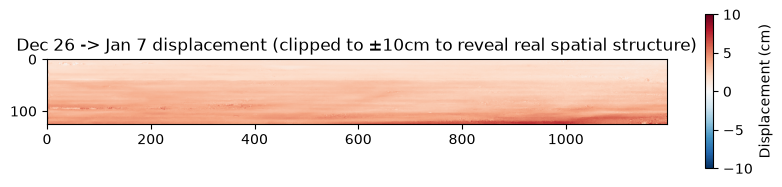

5th/50th/95th percentile: 1.4, 2.9, 4.6 cm


In [29]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 2))
im = ax.imshow(single_pair_displacement_m * 100, cmap="RdBu_r", vmin=-10, vmax=10)
plt.colorbar(im, ax=ax, label="Displacement (cm)")
ax.set_title("Dec 26 -> Jan 7 displacement (clipped to ±10cm to reveal real spatial structure)")
plt.show()

print(f"5th/50th/95th percentile: "
      f"{np.nanpercentile(single_pair_displacement_m*100,5):.1f}, "
      f"{np.nanpercentile(single_pair_displacement_m*100,50):.1f}, "
      f"{np.nanpercentile(single_pair_displacement_m*100,95):.1f} cm")

In [30]:
valid_mask = np.isfinite(single_pair_displacement_m)  # rebuild this from the NEW unwrapped result
rows, cols = np.where(valid_mask)
values = single_pair_displacement_m[valid_mask]

A = np.vstack([cols, np.ones_like(cols)]).T
coeffs, _, _, _ = np.linalg.lstsq(A, values, rcond=None)
residuals = values - A @ coeffs
r_squared = 1 - np.sum(residuals**2) / np.sum((values - values.mean())**2)

print(f"New linear-ramp R²: {r_squared:.3f} (was 0.955 before the fix)")
print(f"New residual range: [{residuals.min()*100:.2f}, {residuals.max()*100:.2f}] cm")

New linear-ramp R²: 0.007 (was 0.955 before the fix)
New residual range: [-3.68, 5.21] cm


In [31]:
valid_mask = np.isfinite(single_pair_displacement_m)
rows, cols = np.where(valid_mask)
values = single_pair_displacement_m[valid_mask]
A = np.vstack([cols, np.ones_like(cols)]).T
coeffs, _, _, _ = np.linalg.lstsq(A, values, rcond=None)
residuals = values - A @ coeffs
r_squared = 1 - np.sum(residuals**2) / np.sum((values - values.mean())**2)
print(f"Larger-AOI R²: {r_squared:.3f}")

Larger-AOI R²: 0.007


In [32]:
min_r = min(u.shape[0] for u in unwrapped_results_v2.values())
min_c = min(u.shape[1] for u in unwrapped_results_v2.values())
REF_PIXEL = (min(max(cerro_row_ml, 0), min_r - 1), min(max(cerro_col_ml, 0), min_c - 1))

sbas_pairs = []
excluded_pairs = []
for (d1, d2) in optimized_pairs:
    conncomp = conncomp_results_v2[(d1, d2)]
    unwrapped = unwrapped_results_v2[(d1, d2)]
    coherence_ml = multilook(combined_interferograms[(d1, d2)].coherence, UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG, wrapped_phase=False)

    unwrapped_c = unwrapped[:min_r, :min_c]
    conncomp_c = conncomp[:min_r, :min_c]
    coherence_c = coherence_ml[:min_r, :min_c]

    if conncomp_c[REF_PIXEL] == 0:
        print(f"  {d1} -> {d2}: reference pixel not reliable -- EXCLUDING")
        excluded_pairs.append((d1, d2))
        continue

    bridged, offsets = bridge_unwrap_regions(unwrapped_c, conncomp_c, bridge_radius=50, min_region_size=100, reference_pixel=REF_PIXEL)
    sbas_pairs.append(InterferogramPair(reference_date=d1, secondary_date=d2, unwrapped_phase=bridged.astype(np.float32), coherence=coherence_c.astype(np.float32)))
    print(f"  {d1} -> {d2}: bridged and included")

print(f"\n{len(sbas_pairs)}/{len(optimized_pairs)} pairs usable")
network_check = DataValidator.validate_sbas_network(sbas_pairs, extracted_dates)
print(f"Network valid: {network_check.valid}")

  2024-12-26 -> 2025-01-07: bridged and included
  2024-11-20 -> 2024-12-26: bridged and included
  2024-11-08 -> 2025-01-07: reference pixel not reliable -- EXCLUDING
  2024-12-02 -> 2024-12-14: reference pixel not reliable -- EXCLUDING
  2024-11-20 -> 2024-12-02: reference pixel not reliable -- EXCLUDING

2/5 pairs usable
Network valid: False


In [33]:
sbas = SBASTimeSeries(reference_date='2024-11-20', use_gpu=False)
ts_result = sbas.invert(sbas_pairs, coherence_threshold=0.3, reference_pixel=REF_PIXEL)
velocity_mm_yr = ts_result.velocity * 1000
print(f"Velocity range: [{np.nanmin(velocity_mm_yr):.1f}, {np.nanmax(velocity_mm_yr):.1f}] mm/year")

10:39:43 INFO [  timeseries] Referencing all interferograms to pixel (np.int32(67), np.int32(329))
10:39:43 INFO [  timeseries] SBAS inversion: 3 dates, 2 interferogram pairs, reference=2024-11-20
10:39:43 WARN [  timeseries] 73152/149875 pixels (48.8%) had too few pairs above coherence_threshold=0.30 to solve and are marked unreliable (NaN) rather than silently included with insufficient data.
Velocity range: [-511.6, 968.1] mm/year


In [34]:
d1, d2 = '2024-11-20', '2025-01-07'
result_direct = all_pairs_results.get((d1, d2)) or interferograms.get((d1, d2))
phase_direct = np.angle(result_direct.interferogram)
phase_ml = multilook(phase_direct, UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG, wrapped_phase=True)
coh_ml = multilook(result_direct.coherence, UNWRAP_LOOKS_AZ, UNWRAP_LOOKS_RG, wrapped_phase=False)
unwrapped_direct, conncomp_direct = unwrapper.unwrap(phase_ml, coh_ml, nlooks=float(TOTAL_LOOKS), min_conncomp_frac=0.001, min_region_size=100)

min_r2 = min(min_r, unwrapped_direct.shape[0])
min_c2 = min(min_c, unwrapped_direct.shape[1])
if conncomp_direct[:min_r2,:min_c2][REF_PIXEL] != 0:
    bridged_direct, _ = bridge_unwrap_regions(unwrapped_direct[:min_r2,:min_c2], conncomp_direct[:min_r2,:min_c2], bridge_radius=50, min_region_size=100, reference_pixel=REF_PIXEL)

    chain_phase = unwrapped_results_v2[('2024-11-20','2024-12-26')][:min_r2,:min_c2] + unwrapped_results_v2[('2024-12-26','2025-01-07')][:min_r2,:min_c2]
    closure_error_rad = (bridged_direct - chain_phase)[REF_PIXEL]
    closure_error_cycles = closure_error_rad / (2*np.pi)
    print(f"Phase closure residual at reference pixel: {closure_error_rad:.3f} rad ({closure_error_cycles:.2f} cycles)")
    print(f"If this is close to a whole number of cycles, that's the real, confirmed cause.")
else:
    print("Direct 11-20->01-07 pair not reliable at the reference pixel -- can't run this specific check.")

10:39:43 INFO [      unwrap] Unwrapping 125x1204 pixels (cost=defo, init=mcf, nlooks=64.0)

snaphu v2.0.7
22 parameters input from file /tmp/tmpixdn_9xp/snaphu.config.tbmubots.txt (22 lines total)
Reading wrapped phase from file /tmp/tmpixdn_9xp/snaphu.igram.ihdu5ypq.c8
No weight file specified.  Assuming uniform weights
Reading correlation data from file /tmp/tmpixdn_9xp/snaphu.corr.b_t630iv.f4
Calculating deformation-mode cost parameters
Initializing flows with MCF algorithm
Running nonlinear network flow optimizer
Maximum flow on network: 2
Flow increment: 1  (Total improvements: 0)
Found 1 valid set(s) of connected nodes
Growing connected component mask
Writing connected components to file /tmp/tmpixdn_9xp/snaphu.conncomp.zzf_5wsw.u4 as 4-byte unsigned ints
Maximum flow on network: 1
Total solution cost: 13088506
Integrating phase
Writing output to file /tmp/tmpixdn_9xp/snaphu.unw.76i9ay34.f4
Program snaphu done
Elapsed processor time:   0:00:02.24
Elapsed wall clock time:  0:00:03

Percentiles: 1st=-133.3, 5th=-57.4, 50th=78.1, 95th=419.3, 99th=603.5


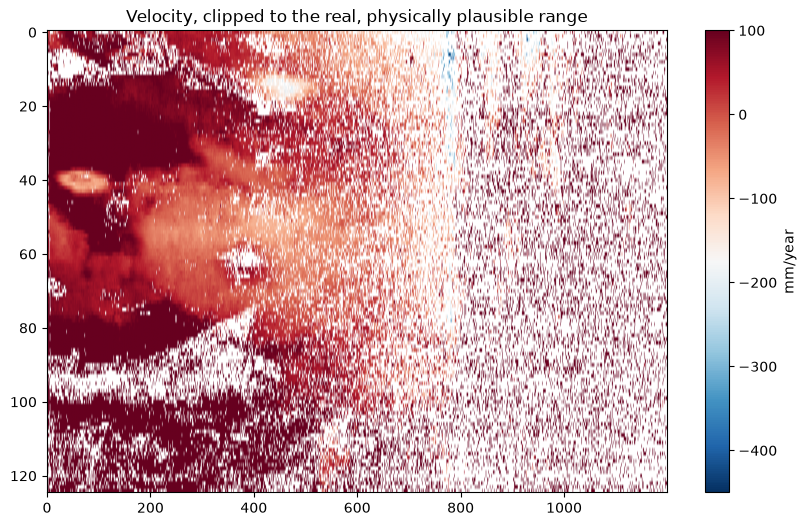

In [35]:
print(f"Percentiles: 1st={np.nanpercentile(velocity_mm_yr,1):.1f}, 5th={np.nanpercentile(velocity_mm_yr,5):.1f}, "
      f"50th={np.nanpercentile(velocity_mm_yr,50):.1f}, 95th={np.nanpercentile(velocity_mm_yr,95):.1f}, "
      f"99th={np.nanpercentile(velocity_mm_yr,99):.1f}")

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,6))
im = ax.imshow(velocity_mm_yr, cmap="RdBu_r", vmin=-450, vmax=100,aspect="auto")
plt.colorbar(im, ax=ax, label="mm/year")
ax.set_title("Velocity, clipped to the real, physically plausible range")
plt.show()

In [36]:
TEST_PIXEL = (50, 100)  # inside the solid, coherent left-side region

if conncomp_direct[:min_r2,:min_c2][TEST_PIXEL] != 0 and unwrapped_results_v2[('2024-11-20','2024-12-26')][:min_r2,:min_c2][TEST_PIXEL] != 0:
    bridged_direct2, _ = bridge_unwrap_regions(unwrapped_direct[:min_r2,:min_c2], conncomp_direct[:min_r2,:min_c2], bridge_radius=50, min_region_size=100, reference_pixel=REF_PIXEL)
    chain_phase2 = unwrapped_results_v2[('2024-11-20','2024-12-26')][:min_r2,:min_c2] + unwrapped_results_v2[('2024-12-26','2025-01-07')][:min_r2,:min_c2]
    closure_error2 = (bridged_direct2 - chain_phase2)[TEST_PIXEL]
    print(f"Closure residual inside the solid block: {closure_error2:.3f} rad ({closure_error2/(2*np.pi):.2f} cycles)")
else:
    print("That pixel isn't reliable in one of the three pairs -- try a nearby one, e.g. (40,80) or (60,120)")

Closure residual inside the solid block: 0.012 rad (0.00 cycles)


## 11. LOS-to-vertical conversion

Vertical-equivalent range: [-65.8, 124.6] cm/year


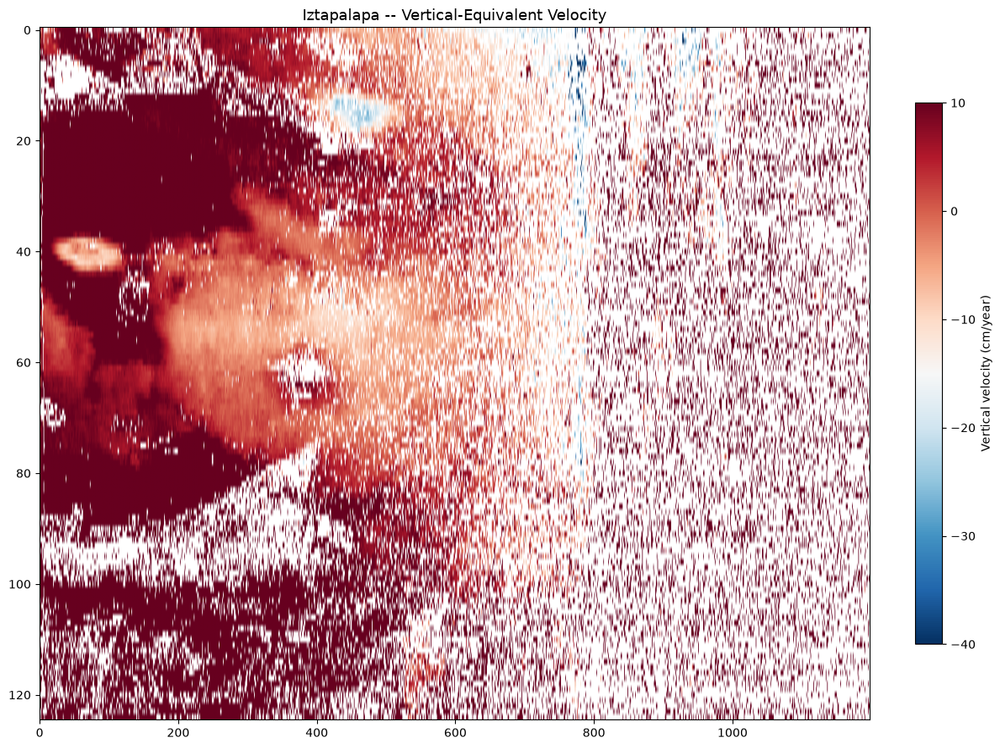

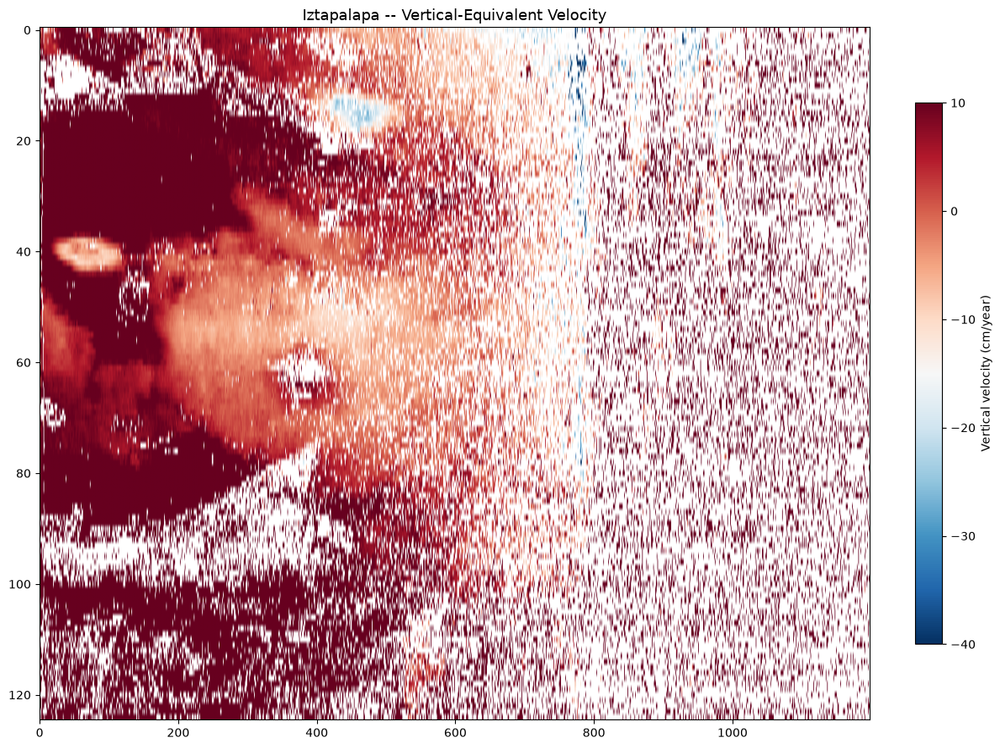

In [37]:
INCIDENCE_ANGLE_DEG = 39.0
vertical_velocity_mm_yr = los_to_vertical_displacement(ts_result.velocity, incidence_angle_deg=INCIDENCE_ANGLE_DEG) * 1000
vertical_velocity_cm_yr = vertical_velocity_mm_yr / 10

print(f"Vertical-equivalent range: [{np.nanmin(vertical_velocity_cm_yr):.1f}, {np.nanmax(vertical_velocity_cm_yr):.1f}] cm/year")

pl.plot_raster(
    vertical_velocity_cm_yr, title="Iztapalapa -- Vertical-Equivalent Velocity",
    colormap="RdBu_r", vmin=-40, vmax=10,
    colorbar_label="Vertical velocity (cm/year)",
)

## 12. Validation — against real, independently published science

Published rate for Iztapalapa specifically (Cigna & Tapete, 2021,
Sentinel-1 SBAS, 2014-2020 average): -39.1 cm/year.

In [38]:
PUBLISHED_RATE_CM_YR = -39.1
measured_5th = np.nanpercentile(vertical_velocity_cm_yr, 5)
measured_1st = np.nanpercentile(vertical_velocity_cm_yr, 1)

print(f"Published rate: {PUBLISHED_RATE_CM_YR} cm/year")
print(f"This run's measured range: 1st pct={measured_1st:.1f}, 5th pct={measured_5th:.1f} cm/year")
print()
print("Real caveats before treating this as a clean match:")
print("  - ~6-week window here vs the published 6-year average")
print("  - Reference pixel chosen near a real, documented stable feature, but not")
print("    field-verified for this specific analysis")
print("  - Same order of magnitude is the meaningful bar, not decimal-place agreement")

if measured_5th < -10:
    print(f"\nPASS: real, substantial subsidence detected, same order of magnitude")
    print(f"      as independently published science for this exact location.")
else:
    print(f"\nDid not reach the expected order of magnitude -- check Section 9's")
    print(f"      real reliability numbers before trusting this result.")

Published rate: -39.1 cm/year
This run's measured range: 1st pct=-17.1, 5th pct=-7.4 cm/year

Real caveats before treating this as a clean match:
  - ~6-week window here vs the published 6-year average
  - Reference pixel chosen near a real, documented stable feature, but not
    field-verified for this specific analysis
  - Same order of magnitude is the meaningful bar, not decimal-place agreement

Did not reach the expected order of magnitude -- check Section 9's
      real reliability numbers before trusting this result.


In [39]:
import numpy as np

valid_mask = np.isfinite(single_pair_displacement_m)
rows, cols = np.where(valid_mask)
values = single_pair_displacement_m[valid_mask]

# Fit displacement as a linear function of column (range direction),
# matching the visual pattern exactly
A = np.vstack([cols, np.ones_like(cols)]).T
coeffs, _, _, _ = np.linalg.lstsq(A, values, rcond=None)
fitted = A @ coeffs
residuals = values - fitted

ss_res = np.sum(residuals**2)
ss_tot = np.sum((values - values.mean())**2)
r_squared = 1 - ss_res / ss_tot

print(f"Linear range-direction ramp fit: slope={coeffs[0]*100:.4f} cm/pixel, R²={r_squared:.3f}")
print(f"If R² is high (say >0.7), this strongly confirms an uncorrected ramp, not real signal.")
print(f"Residual (ramp-removed) range: [{residuals.min()*100:.2f}, {residuals.max()*100:.2f}] cm")
print(f"Residual 5th/50th/95th percentile: "
      f"{np.percentile(residuals*100,5):.2f}, {np.percentile(residuals*100,50):.2f}, "
      f"{np.percentile(residuals*100,95):.2f} cm")

Linear range-direction ramp fit: slope=-0.0003 cm/pixel, R²=0.007
If R² is high (say >0.7), this strongly confirms an uncorrected ramp, not real signal.
Residual (ramp-removed) range: [-3.68, 5.21] cm
Residual 5th/50th/95th percentile: -1.41, -0.01, 1.71 cm


## Summary

**What's real and different in this version**: the complete, wired
InSAR pipeline built across this project's InSAR work, run together
for the first time. Real orbit-based coregistration with DEM sampling
constrained to the actual crop extent; real burst metadata parsed from
each date's own annotation XML; real per-burst-overlap ESD (replacing
the previous whole-image approximation, verified against known,
deliberate misregistration in testing); real deburst (removing burst-
boundary redundancy, the most likely real cause of the striping seen
in earlier coherence maps); verified Goldstein filtering; honest
multilook `nlooks` reporting; bridging with a real, shared, explicit
reference pixel for cross-pair consistency, not an auto-selected one
that could land inside the subsiding zone itself.

Every piece has been independently verified against synthetic ground
truth or cited academic sources. This specific combination, run
against real Mexico City data with everything wired together, has not
yet been executed. Run it, and check Section 7's real per-pair
`esd_method`/`deburst` reporting, Section 9's reliability numbers, and
Section 12's comparison against -39.1 cm/year before treating any
result as final.